## Import Packages

In [3]:
import os
import pandas as pd
import numpy as np
import networkx as nx
from analyze import NetworkAnalysis
from networkx.algorithms import bipartite as bp
import matplotlib.pyplot as plt

## Read and Filter Data

In [45]:
path = os.getcwd()
df = pd.read_csv(path+'\\data\\cleaned_data.csv')
# df = pd.read_csv(path+'\\data\\data_example.csv')
df = df.drop(df.columns[0],axis=1)

In [46]:
userSpace = df[(df.from_address_type == 'EOA') & (df.to_address_type == 'EOA')]
bipartiteSpace = df[((df.from_address_type == 'EOA') & (df.to_address_type == 'Contract')) | ((df.from_address_type == 'Contract') & (df.to_address_type == 'EOA'))]

In [47]:
userSpace = userSpace[['from_address','to_address','value']]
bipartiteSpace = bipartiteSpace[['from_address','to_address','value']]

In [39]:
a = np.array(userSpace['from_address'])
b = np.array(userSpace['to_address'])
c = np.unique(np.vstack((a,b)).flatten())
len(c)

52

## Plot User Space Network

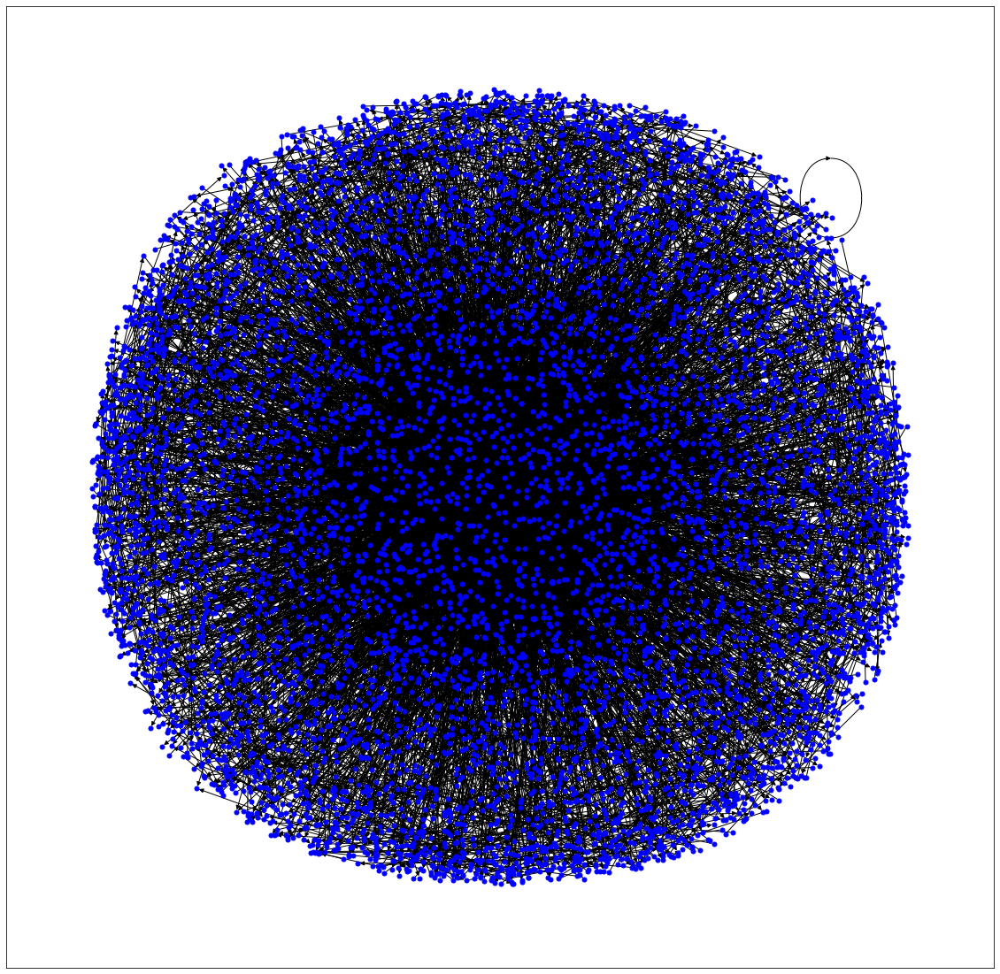

In [217]:
classObj = NetworkAnalysis(userSpace)
classObj.plot_network(classObj.gen_network())

## Bipartite Test 1

In [10]:
B = nx.Graph()
# Add nodes with the node attribute "bipartite"
B.add_nodes_from(np.unique(np.array(bipartiteSpace['from_address'])), bipartite=0)
B.add_nodes_from(np.unique(np.array(bipartiteSpace['to_address'])), bipartite=1)
# Add edges only between nodes of opposite node sets
B.add_edges_from(list(zip(bipartiteSpace['from_address'], bipartiteSpace['to_address'])))

In [11]:
nx.is_connected(B)

False

In [12]:
nx.is_bipartite(B)

True

In [13]:
print("# of unique from_address: "+str(len(bipartiteSpace['from_address'].unique())))
print("# of unique to_address: "+str(len(bipartiteSpace['to_address'].unique())))

# of unique from_address: 5704
# of unique to_address: 738


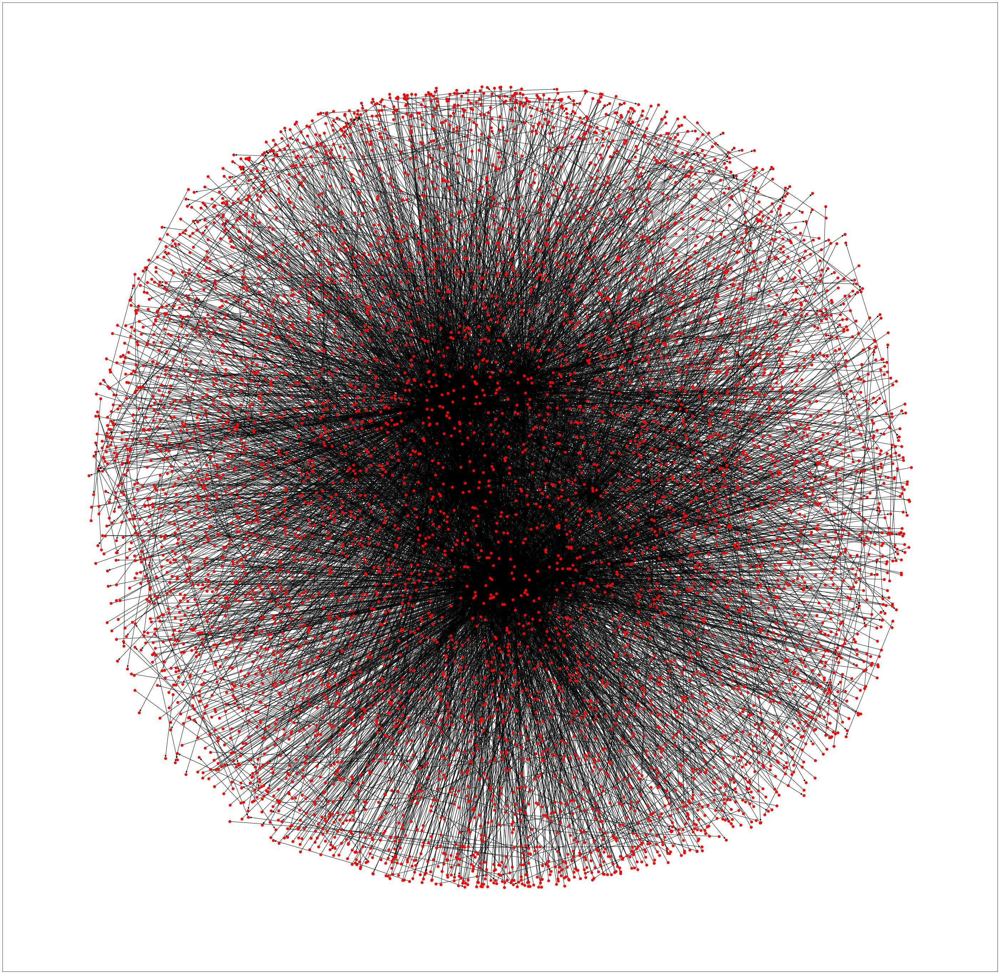

In [14]:
plt.figure(figsize=(50, 50))
pos=nx.spring_layout(B, k=0.15)
nx.draw_networkx(B,pos,arrows=True, node_color='red',node_size=50, with_labels=False) #, node_color='blue'
plt.show()

## Bipartite Test 2

In [105]:
users = np.unique(np.array(bipartiteSpace['from_address']))
contracts = np.unique(np.array(bipartiteSpace['to_address']))
edges = list(zip(bipartiteSpace['from_address'], bipartiteSpace['to_address']))

In [106]:
plt.figure(figsize=(25, 25))

B = nx.Graph()
B.add_nodes_from(users, bipartite=0)
B.add_nodes_from(contracts, bipartite=1)
B.add_edges_from(edges)

# pos=nx.spring_layout(B)#, k=0.15

# # draw the network - user nodes
# nx.draw(B,
#         pos,
#         arrows=True,
#         nodelist=list(users),
#         node_color='red',
#         # with_labels=True,
#         # font_size=24,
#         node_size=250)

# # draw the network - contract nodes
# nx.draw(B,
#         pos,
#         arrows=True,
#         nodelist=list(contracts),
#         node_color='blue',
#         node_shape='s',
#         # with_labels=True,
#         # font_size=24,
#         node_size=250)

# # show the plot
# plt.show()

<Figure size 1800x1800 with 0 Axes>

In [148]:
gcc = list(max(nx.connected_components(B), key=lambda x: len(x)))
# all_nodes = list(B.nodes())
# remove_nodes = list(set(all_nodes) - set(gcc))

In [149]:
gcc_df = bipartiteSpace[bipartiteSpace['from_address'].isin(gcc) | bipartiteSpace['to_address'].isin(gcc)]
gcc_users = np.unique(np.array(gcc_df['from_address']))
gcc_contracts = np.unique(np.array(gcc_df['to_address']))
gcc_edges = list(zip(gcc_df['from_address'], gcc_df['to_address']))

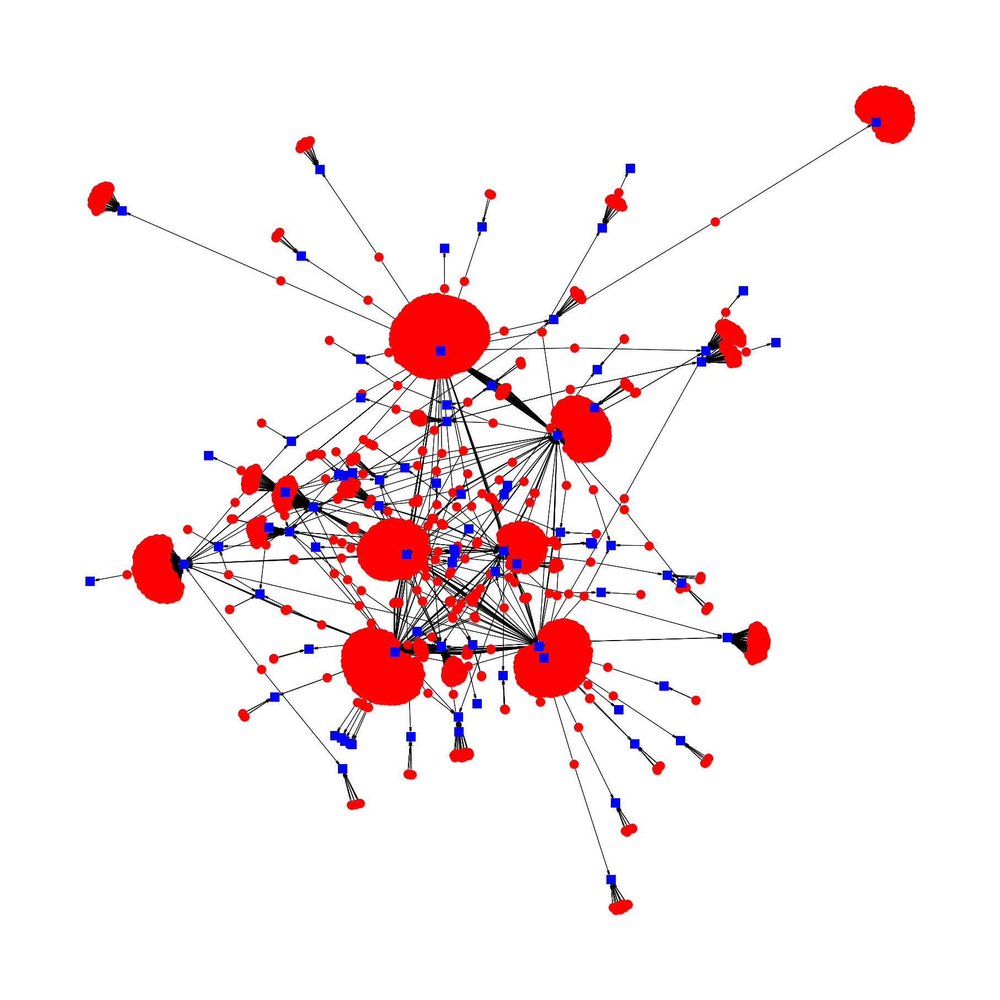

In [150]:
plt.figure(figsize=(25, 25))

B = nx.Graph()
B.add_nodes_from(gcc_users, bipartite=0)
B.add_nodes_from(gcc_contracts, bipartite=1)
B.add_edges_from(gcc_edges)

pos=nx.spring_layout(B)#, k=0.15

# draw the network - user nodes
nx.draw(B,
        pos,
        arrows=True,
        nodelist=list(gcc_users),
        node_color='red',
        # with_labels=True,
        # font_size=24,
        node_size=250)

# draw the network - contract nodes
nx.draw(B,
        pos,
        arrows=True,
        nodelist=list(gcc_contracts),
        node_color='blue',
        node_shape='s',
        # with_labels=True,
        # font_size=24,
        node_size=250)

# show the plot
plt.show()